# Task 1

1. Data generating

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

np.random.seed(0)
N = 100
xmin, xmax = 0.0, 10.0
x = np.random.uniform(xmin, xmax, size=N)
x = np.sort(x)

def true_function(x):
    eps = 1e-6   # to avoid log(0)
    return (np.log(np.clip(x, eps, None)) + 1) * np.cos(x) + np.sin(2 * x)

y_clean = true_function(x)
noise = np.random.normal(0, 1, size=N)  # Gaussian noise, mean 0, variance 1
y_noisy = y_clean + noise



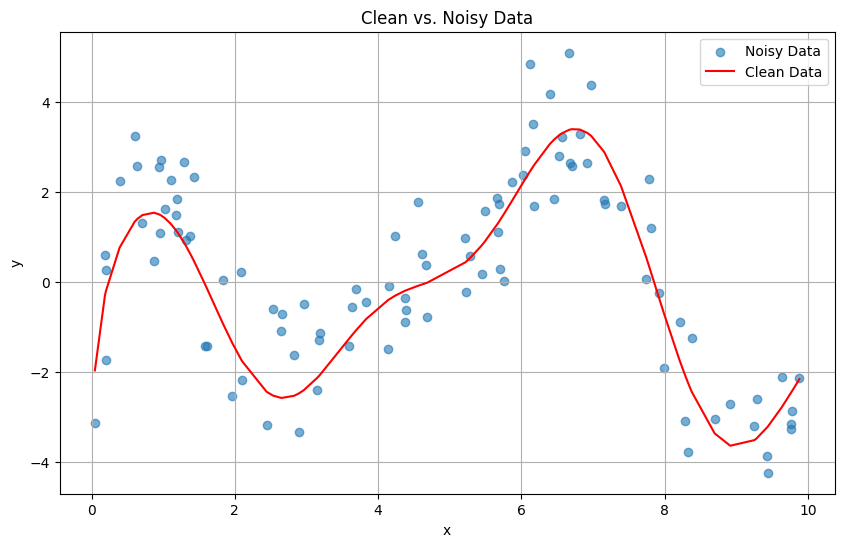

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(x, y_noisy, label='Noisy Data', alpha=0.6)
plt.plot(x, y_clean, color='red', label='Clean Data')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Clean vs. Noisy Data')
plt.legend()
plt.grid(True)
plt.show()

2. Non-linear basis functions

In [ ]:
def gaussian_basis(x, mu, sigma=1.0):
    """Compute Gaussian basis function φ(x; μ, σ) = exp(-((x - μ)^2) / σ^2)."""
    return np.exp(-((x - mu) ** 2) / (sigma ** 2))

def gaussian_basis_matrix(x, D, sigma=1.0, xmin=None, xmax=None):
    """
    Construct design matrix Φ for D Gaussian basis functions + bias term.
    """
    if D == 0:
        return np.ones((len(x), 1)),[] # only bias term
    if xmin is None:
        xmin = np.min(x)
    if xmax is None:
        xmax = np.max(x)

    mus = np.linspace(xmin, xmax, D)
    Phi = np.column_stack([gaussian_basis(x, mu, sigma) for mu in mus])
    Phi = np.column_stack([Phi, np.ones(len(x))])  # add bias
    return Phi,mus

3. Model Fitting

In [ ]:
class LinearRegressionClosedForm:
    def __init__(self, add_bias=True):
        self.add_bias = add_bias
        self.w = None

    def fit(self, Phi, y):
        X = np.array(Phi)
        if X.ndim == 1:
            X = X[:, None]
        if self.add_bias:
            X = np.column_stack([X, np.ones(X.shape[0])])
        self.w, *_ = np.linalg.lstsq(X, y, rcond=None)
        return self

    def predict(self, Phi):
        X = np.array(Phi)
        if X.ndim == 1:
            X = X[:, None]
        if self.add_bias:
            X = np.column_stack([X, np.ones(X.shape[0])])
        return X @ self.w

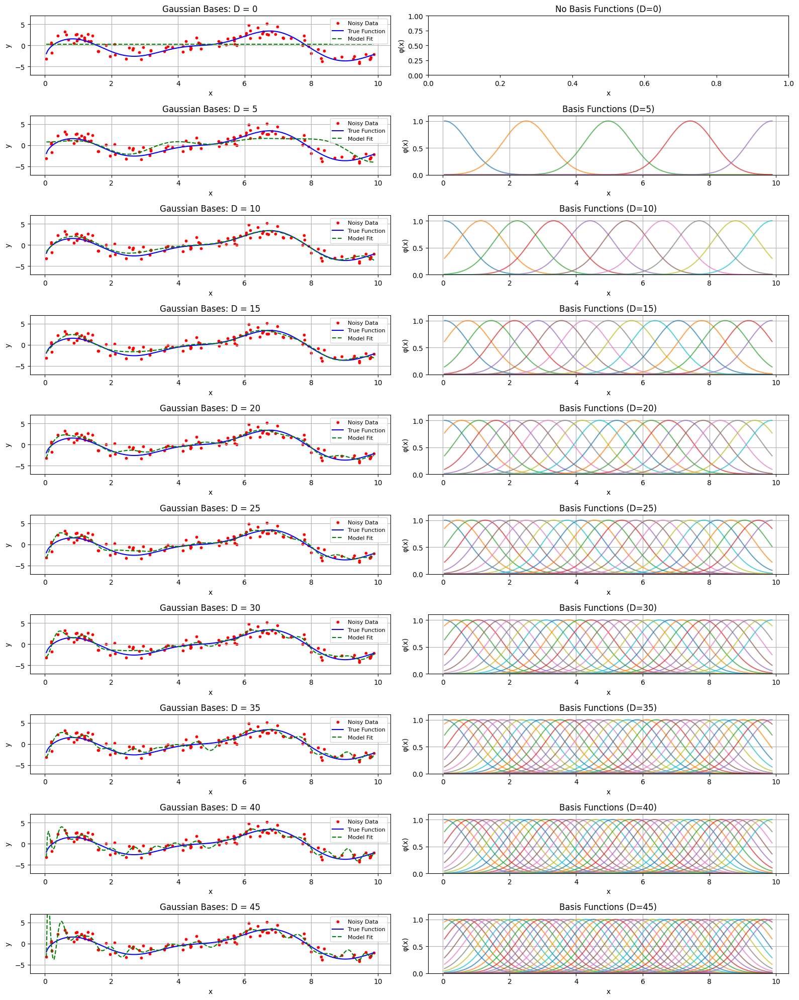

In [ ]:
Ds = list(range(0, 50, 5))
xmin, xmax = x.min(), x.max()
x_grid = np.linspace(xmin, xmax, 300)
y_true = true_function(x_grid)

plt.figure(figsize=(16, 20))

for i, D in enumerate(Ds, 1):
    # Construct design matrices
    if D == 0:
        X_train = np.ones((len(x), 1))
        X_grid = np.ones((len(x_grid), 1))
        mus = []
    else:
        X_train,mus = gaussian_basis_matrix(x, D, sigma=1.0, xmin=xmin, xmax=xmax)
        X_grid,mus = gaussian_basis_matrix(x_grid, D, sigma=1.0, xmin=xmin, xmax=xmax)

    # Solve least squares: w = (ΦᵀΦ)⁻¹Φᵀy
    w = np.linalg.lstsq(X_train, y_noisy, rcond=None)[0]
    y_pred_grid = X_grid @ w

    plt.subplot(len(Ds), 2, i*2-1) # Plot fitted curve on the left
    plt.scatter(x, y_noisy, color='r', s=10, label='Noisy Data')
    plt.plot(x_grid, y_true, 'b-', label='True Function')
    plt.plot(x_grid, y_pred_grid, 'g--', label='Model Fit')

    plt.title(f"Gaussian Bases: D = {D}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.ylim(-7, 7)
    plt.legend(fontsize=8)
    plt.grid(True)

    # Plot basis functions on the right
    plt.subplot(len(Ds), 2, i*2)
    if D > 0:
        for mu in mus:
            plt.plot(x_grid, gaussian_basis(x_grid, mu, sigma=1.0), alpha=0.7)
        plt.title(f"Basis Functions (D={D})")
        plt.xlabel("x")
        plt.ylabel("φ(x)")
        plt.ylim(0, 1.1) # Basis functions are between 0 and 1
        plt.grid(True)
    else:
        plt.title("No Basis Functions (D=0)")
        plt.xlabel("x")
        plt.ylabel("φ(x)")


plt.tight_layout()
plt.show()

4. Model Selection

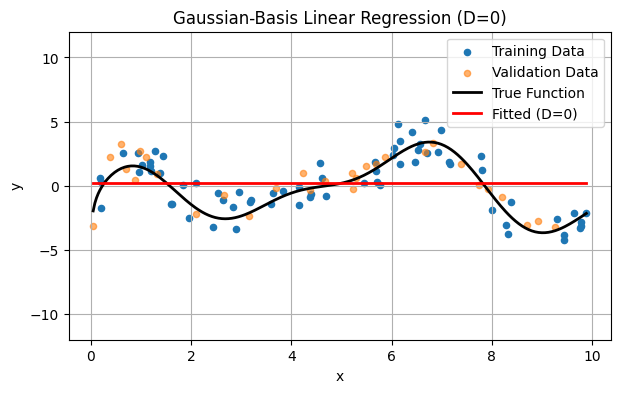

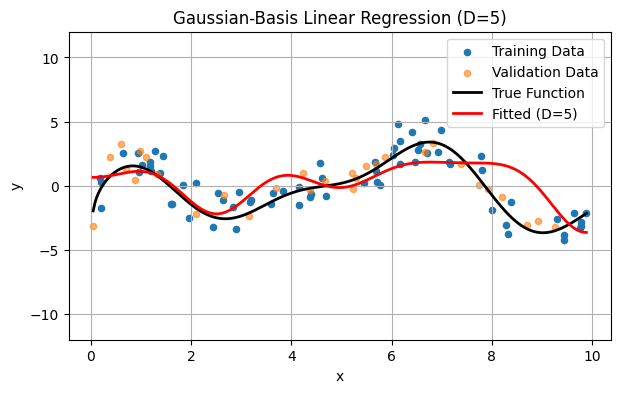

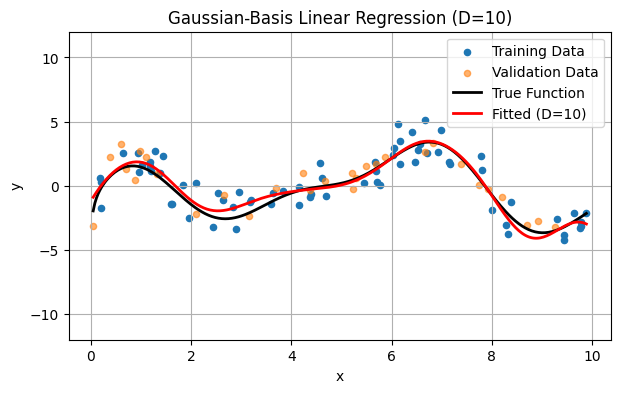

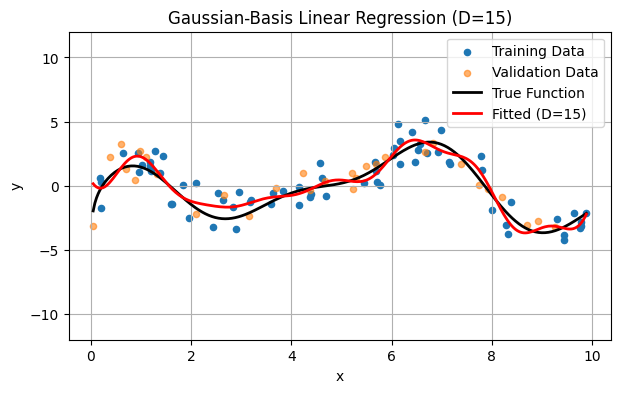

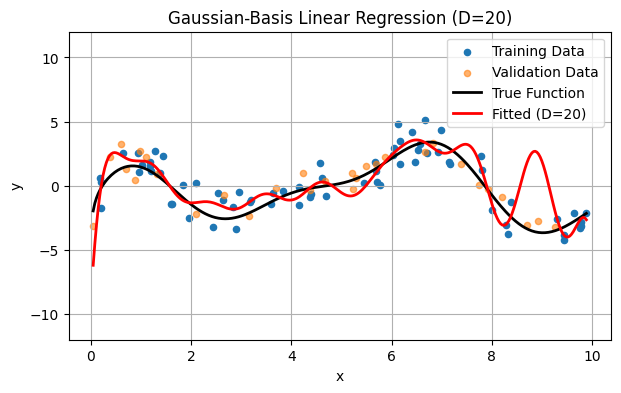

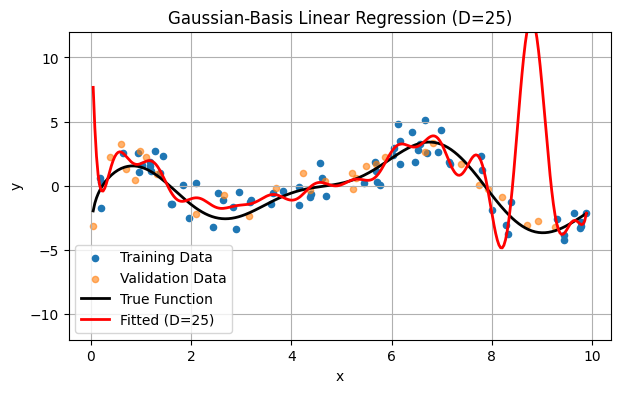

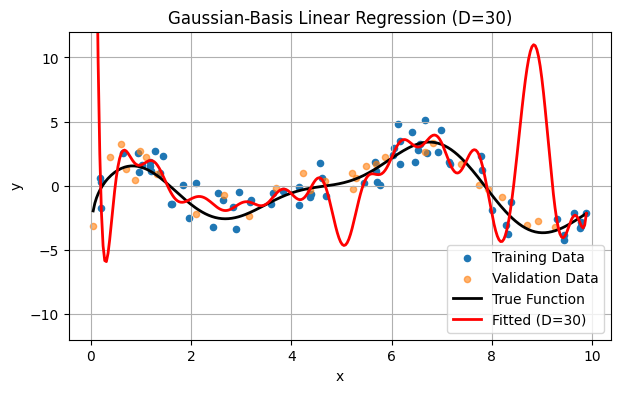

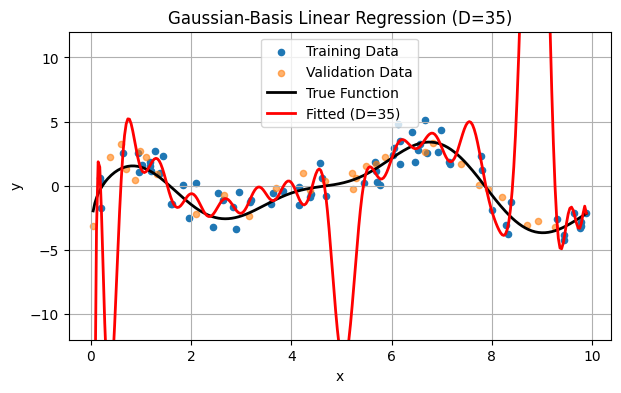

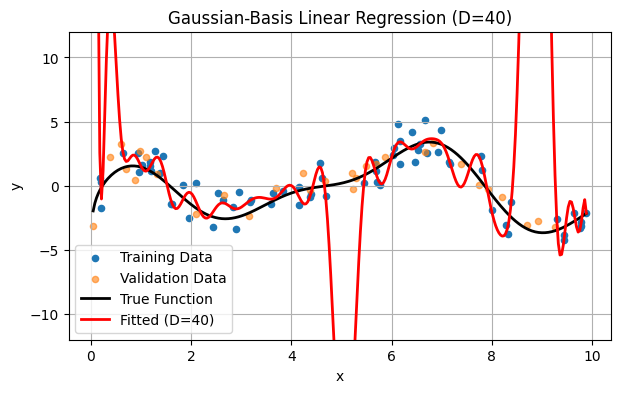

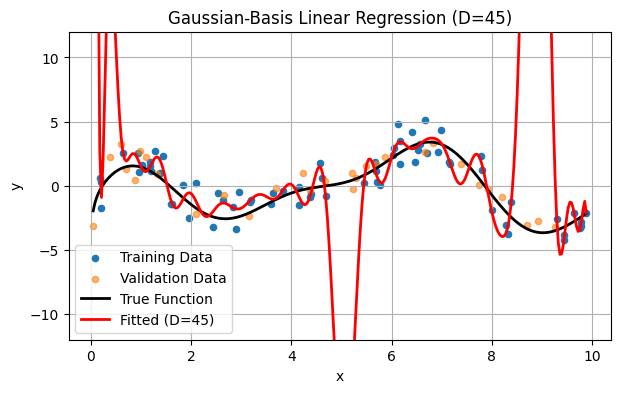

    D   sse_train       sse_val
0   0  362.158845    110.094637
1   5  183.065380     75.690285
2  10   72.870728     26.012646
3  15   66.207027     34.971438
4  20   60.720475     91.422351
5  25   49.318912    567.854066
6  30   44.793479   3530.098643
7  35   38.091897   5993.562441
8  40   36.482662  54307.710111
9  45   36.716545  75734.072542

Optimal number of Gaussian bases:
  D = 10
  Training SSE = 72.8707
  Validation SSE = 26.0126


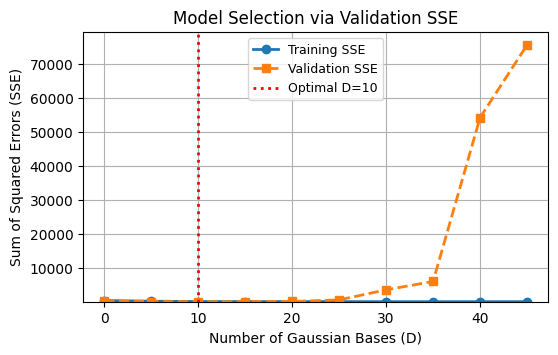

In [ ]:
idx = np.arange(N)

np.random.shuffle(idx)
n_train = int(0.7 * N)
train_idx, val_idx = idx[:n_train], idx[n_train:]
x_train, y_train = x[train_idx], y_noisy[train_idx]
x_val, y_val = x[val_idx], y_noisy[val_idx]
results = []

for D in Ds:
    # Build design matrices
    Phi_train, _ = gaussian_basis_matrix(x_train, D, sigma=1.0, xmin=xmin, xmax=xmax)
    Phi_val, _   = gaussian_basis_matrix(x_val, D, sigma=1.0, xmin=xmin, xmax=xmax)
    Phi_grid, _  = gaussian_basis_matrix(x_grid, D, sigma=1.0, xmin=xmin, xmax=xmax)

    # Fit model on training data
    model = LinearRegressionClosedForm(add_bias=True).fit(Phi_train, y_train)

    # Predict on training, validation, and grid
    y_train_pred = model.predict(Phi_train)
    y_val_pred   = model.predict(Phi_val)
    y_grid_pred  = model.predict(Phi_grid)

    # Compute SSEs
    sse_train = np.sum((y_train - y_train_pred) ** 2)
    sse_val   = np.sum((y_val - y_val_pred) ** 2)
    results.append({'D': D, 'sse_train': sse_train, 'sse_val': sse_val})

    # Plot fitted curve vs data
    plt.figure(figsize=(7, 4))
    plt.scatter(x_train, y_train, s=20, label='Training Data')
    plt.scatter(x_val, y_val, s=20, label='Validation Data', alpha=0.6)
    plt.plot(x_grid, y_true, 'k-', lw=2, label='True Function')
    plt.plot(x_grid, y_grid_pred, 'r-', lw=2, label=f'Fitted (D={D})')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Gaussian-Basis Linear Regression (D={D})')
    plt.ylim(-12,12)
    plt.legend()
    plt.grid(True)
    plt.show()

df = pd.DataFrame(results)
best_row = df.loc[df['sse_val'].idxmin()]
best_D = int(best_row['D'])

print(df)
print("\nOptimal number of Gaussian bases:")
print(f"  D = {best_D}")
print(f"  Training SSE = {best_row['sse_train']:.4f}")
print(f"  Validation SSE = {best_row['sse_val']:.4f}")

plt.figure(figsize=(6,3.5))
plt.plot(df['D'], df['sse_train'], 'o-', label='Training SSE', linewidth=2, markersize=6)
plt.plot(df['D'], df['sse_val'], 's--', label='Validation SSE', linewidth=2, markersize=6)
plt.axvline(best_D, color='r', linestyle=':', label=f'Optimal D={best_D}', linewidth=2)
plt.xlabel('Number of Gaussian Bases (D)', fontsize=10)
plt.ylabel('Sum of Squared Errors (SSE)', fontsize=10)
plt.title('Model Selection via Validation SSE', fontsize=12)
plt.legend(fontsize=9)
plt.grid(True)

# Optional: zoom y-axis to better show differences
plt.ylim(df[['sse_train','sse_val']].min().min()*0.95,
         df[['sse_train','sse_val']].max().max()*1.05)

plt.show()

# Task 2


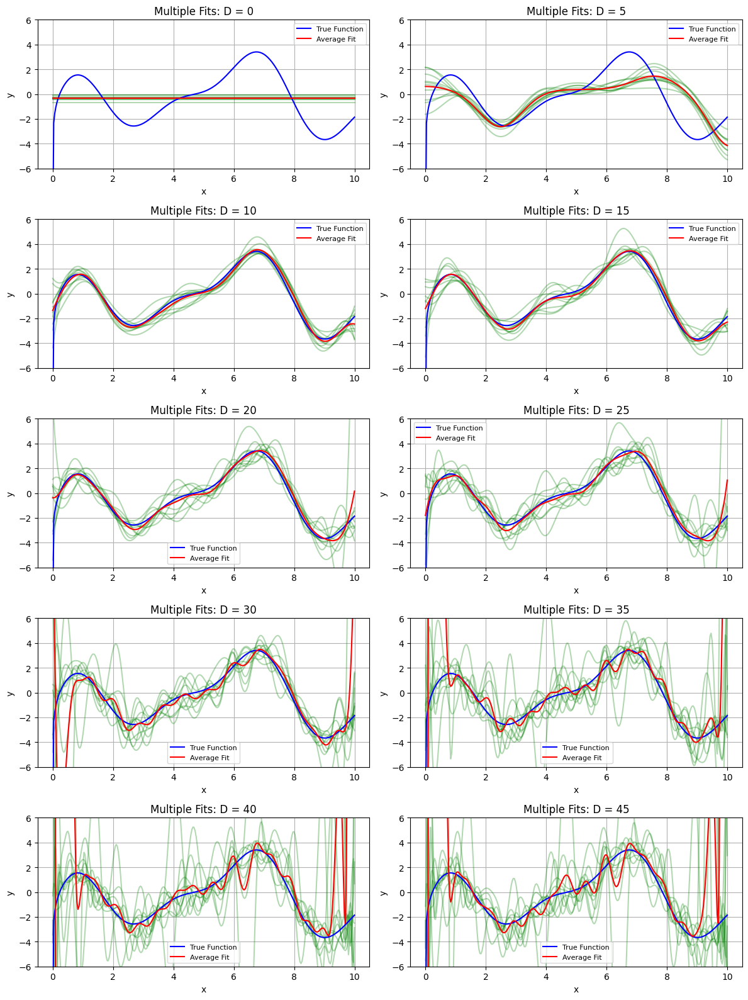

    D  avg_sse_train   avg_sse_val
0   0     354.645442  1.283446e+02
1   5     209.748541  6.965536e+01
2  10      61.768602  3.301121e+01
3  15      56.469919  3.662932e+01
4  20      50.720390  4.086700e+01
5  25      47.217060  4.899822e+01
6  30      41.963034  1.876605e+03
7  35      37.413665  1.996020e+05
8  40      33.924078  1.033770e+07
9  45      33.123101  1.016552e+07

Optimal number of Gaussian bases (averaged over repetitions):
  D = 10
  Average Training SSE = 61.7686
  Average Validation SSE = 33.0112


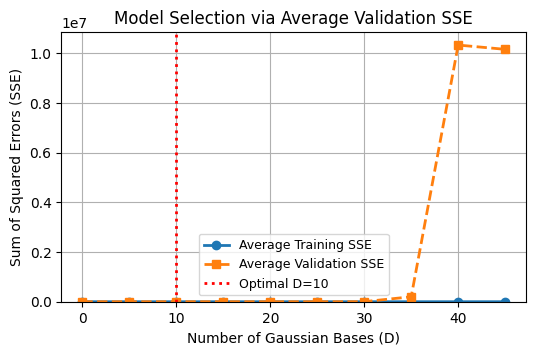

In [ ]:
repeat_times = 10
all_y_pred_grids = {D: [] for D in Ds} # Store predictions for each D
all_results = {D: {'sse_train': [], 'sse_val': []} for D in Ds} # Store SSEs for each D and repetition

for _ in range(repeat_times):
  N = 100
  xmin, xmax = 0.0, 10.0
  x = np.random.uniform(xmin, xmax, size=N)
  x = np.sort(x)

  # Regenerate noisy data for each repetition
  y_clean = true_function(x)
  noise = np.random.normal(0, 1, size=N)  # Gaussian noise, mean 0, variance 1
  y_noisy = y_clean + noise


  idx = np.arange(N)
  np.random.shuffle(idx)
  n_train = int(0.7 * N)
  train_idx, val_idx = idx[:n_train], idx[n_train:]
  x_train, y_train = x[train_idx], y_noisy[train_idx]
  x_val, y_val = x[val_idx], y_noisy[val_idx]
  results = []


  for D in Ds:
      # Build design matrices
      Phi_train, _ = gaussian_basis_matrix(x_train, D, sigma=1.0, xmin=xmin, xmax=xmax)
      Phi_val, _   = gaussian_basis_matrix(x_val, D, sigma=1.0, xmin=xmin, xmax=xmax)
      Phi_grid, _  = gaussian_basis_matrix(x_grid, D, sigma=1.0, xmin=xmin, xmax=xmax)


      # Fit model on training data
      model = LinearRegressionClosedForm(add_bias=True).fit(Phi_train, y_train)

      # Predict on training, validation, and grid
      y_train_pred = model.predict(Phi_train)
      y_val_pred   = model.predict(Phi_val)
      y_grid_pred  = model.predict(Phi_grid)
      all_y_pred_grids[D].append(y_grid_pred) # Store prediction

      # Compute SSEs
      sse_train = np.sum((y_train - y_train_pred) ** 2)
      sse_val   = np.sum((y_val - y_val_pred) ** 2)
      all_results[D]['sse_train'].append(sse_train)
      all_results[D]['sse_val'].append(sse_val)
      results.append({'D': D, 'sse_train': sse_train, 'sse_val': sse_val})


plt.figure(figsize=(12, 16))
x_grid = np.linspace(xmin, xmax, 300)
y_true = true_function(x_grid)


for i, D in enumerate(Ds, 1):
    plt.subplot(len(Ds)//2, 2, i)
    for y_pred_grid in all_y_pred_grids[D]:
        plt.plot(x_grid, y_pred_grid, 'g-', alpha=0.3)  # Plot all individual fits
    plt.plot(x_grid, y_true, 'b-', label='True Function') # Plot true function
    avg_y_pred_grid = np.mean(all_y_pred_grids[D], axis=0)
    plt.plot(x_grid, avg_y_pred_grid, 'r-', label='Average Fit') # Plot average fit

    plt.title(f"Multiple Fits: D = {D}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.ylim(-6, 6)
    plt.legend(fontsize=8)
    plt.grid(True)

plt.tight_layout()
plt.show()


avg_sse_train = [np.mean(all_results[D]['sse_train']) for D in Ds]
avg_sse_val = [np.mean(all_results[D]['sse_val']) for D in Ds]

df_avg = pd.DataFrame({'D': Ds, 'avg_sse_train': avg_sse_train, 'avg_sse_val': avg_sse_val})
best_row_avg = df_avg.loc[df_avg['avg_sse_val'].idxmin()]
best_D_avg = int(best_row_avg['D'])

print(df_avg)
print("\nOptimal number of Gaussian bases (averaged over repetitions):")
print(f"  D = {best_D_avg}")
print(f"  Average Training SSE = {best_row_avg['avg_sse_train']:.4f}")
print(f"  Average Validation SSE = {best_row_avg['avg_sse_val']:.4f}")


plt.figure(figsize=(6,3.5))
plt.plot(df_avg['D'], df_avg['avg_sse_train'], 'o-', label='Average Training SSE', linewidth=2, markersize=6)
plt.plot(df_avg['D'], df_avg['avg_sse_val'], 's--', label='Average Validation SSE', linewidth=2, markersize=6)
plt.axvline(best_D_avg, color='r', linestyle=':', label=f'Optimal D={best_D_avg}', linewidth=2)
plt.xlabel('Number of Gaussian Bases (D)', fontsize=10)
plt.ylabel('Sum of Squared Errors (SSE)', fontsize=10)
plt.title('Model Selection via Average Validation SSE', fontsize=12)
plt.legend(fontsize=9)
plt.grid(True)

# Optional: zoom y-axis to better show differences
plt.ylim(0,
         df_avg[['avg_sse_train','avg_sse_val']].max().max()*1.05)

plt.show()

# Task 3


In [ ]:
class RegularizedLinearRegression:
    def __init__(self, lambda_reg=0.1, reg_type='l2', add_bias=True, max_iter=1000, lr=1e-3):
        self.lambda_reg = lambda_reg
        self.reg_type = reg_type.lower()
        self.add_bias = add_bias
        self.w = None
        self.max_iter = max_iter
        self.lr = lr  # only for L1

    def fit(self, Phi, y):
        X = np.array(Phi)
        y = np.array(y)
        if X.ndim == 1:
            X = X[:, None]
        if self.add_bias:
            X = np.column_stack([X, np.ones(X.shape[0])])

        n_samples, n_features = X.shape

        if self.reg_type == 'l2': # Ridge
            I = np.eye(n_features)
            self.w = np.linalg.solve(X.T @ X + self.lambda_reg * I, X.T @ y)

        elif self.reg_type == 'l1': # Lasso
            # Coordinate descent implementation
            w = np.zeros(n_features)
            for _ in range(self.max_iter):
                for j in range(n_features):
                    # Compute residual excluding feature j
                    y_pred = X @ w
                    rho_j = X[:, j] @ (y - y_pred + w[j] * X[:, j])
                    z_j = np.sum(X[:, j] ** 2)

                    # Soft-thresholding
                    if rho_j < -self.lambda_reg / 2:
                        w[j] = (rho_j + self.lambda_reg / 2) / z_j
                    elif rho_j > self.lambda_reg / 2:
                        w[j] = (rho_j - self.lambda_reg / 2) / z_j
                    else:
                        w[j] = 0.0
            self.w = w

        else:
            raise ValueError("reg_type must be 'l1' or 'l2'")

        return self

    def predict(self, Phi):
        X = np.array(Phi)
        if X.ndim == 1:
            X = X[:, None]
        if self.add_bias:
            X = np.column_stack([X, np.ones(X.shape[0])])
        return X @ self.w

In [ ]:
def sample_dataset(N, noise_var):
    """Sample a dataset with N points and given noise variance."""
    xmin, xmax = 0.0, 10.0
    x = np.random.uniform(xmin, xmax, size=N)
    x = np.sort(x)
    y_clean = true_function(x)
    noise = np.random.normal(0, np.sqrt(noise_var), size=N)
    y_noisy = y_clean + noise
    return x, y_noisy

In [ ]:
def k_fold_cv(model_class, X, y, k=10, lambda_reg=0.1, reg_type='l2'):
    n = len(X)
    indices = np.arange(n)
    np.random.shuffle(indices)
    fold_size = n // k

    # Reshape X to 2D if it's 1D (handles D=0 case)
    if X.ndim == 1:
        X = X[:, None]

    train_errors, val_errors = [], []
    for i in range(k):
        val_idx = indices[i * fold_size:(i + 1) * fold_size]
        train_idx = np.setdiff1d(indices, val_idx)
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = model_class(lambda_reg=lambda_reg, reg_type=reg_type)
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        train_errors.append(np.mean((y_train_pred - y_train) ** 2))
        val_errors.append(np.mean((y_val_pred - y_val) ** 2))

    return np.mean(train_errors), np.mean(val_errors)

In [ ]:
def bias_variance_decomposition(model_class, mus, sigma, lambda_reg, reg_type,
                                num_datasets=50, N=20, noise_var=1.0):
    # print("Bias Variance")
    # Use a fixed x_test for consistent evaluation across datasets
    x_test = np.linspace(0, 10, 200) # Use the full range of the true function
    f_true = true_function(x_test)
    preds = []

    for _ in range(num_datasets):
        x_train, y_train = sample_dataset(N, noise_var)
        # Use gaussian_basis_matrix to get the design matrix for training data
        Phi_train, _ = gaussian_basis_matrix(x_train, len(mus), sigma=sigma, xmin=min(x_train), xmax=max(x_train))
        # Use gaussian_basis_matrix to get the design matrix for test data
        Phi_test, _ = gaussian_basis_matrix(x_test, len(mus), sigma=sigma, xmin=min(x_test), xmax=max(x_test))

        model = model_class(lambda_reg=lambda_reg, reg_type=reg_type)
        model.fit(Phi_train, y_train)
        preds.append(model.predict(Phi_test))

    preds = np.array(preds)
    mean_pred = np.mean(preds, axis=0)
    bias2 = np.mean((mean_pred - f_true) ** 2)
    var = np.mean(np.var(preds, axis=0))
    return bias2, var

In [ ]:
lambdas = np.logspace(-3, 1, 10)
num_datasets = 50
N = 20
D = 45
noise_var = 1
sigma = 0.1

train_errors_L2, val_errors_L2, bias2_L2, var_L2 = [], [], [], []
train_errors_L1, val_errors_L1, bias2_L1, var_L1 = [], [], [], []

for lam in lambdas:
    # print("lam ",lam)
    # Generate one dataset for CV
    x, y = sample_dataset(N, noise_var)
    # Use gaussian_basis_matrix to get the design matrix for CV
    Phi, mus = gaussian_basis_matrix(x, D, sigma=sigma, xmin=min(x), xmax=max(x))


    tr, va = k_fold_cv(RegularizedLinearRegression, Phi, y, k=10, lambda_reg=lam, reg_type='l2')
    train_errors_L2.append(tr)
    val_errors_L2.append(va)
    b2, v = bias_variance_decomposition(RegularizedLinearRegression, mus, sigma, lam, 'l2',
                                        num_datasets=num_datasets, N=N, noise_var=noise_var)
    bias2_L2.append(b2)
    var_L2.append(v)

    tr, va = k_fold_cv(RegularizedLinearRegression, Phi, y, k=10, lambda_reg=lam, reg_type='l1')
    train_errors_L1.append(tr)
    val_errors_L1.append(va)
    b2, v = bias_variance_decomposition(RegularizedLinearRegression, mus, sigma, lam, 'l1',
                                        num_datasets=num_datasets, N=N, noise_var=noise_var)
    bias2_L1.append(b2)
    var_L1.append(v)

# Calculate sum of bias^2 + variance (+noise)
total_error_L2 = np.array(bias2_L2) + np.array(var_L2) + noise_var
total_error_no_noise_L2 = np.array(bias2_L2) + np.array(var_L2)

total_error_L1 = np.array(bias2_L1) + np.array(var_L1) + noise_var
total_error_no_noise_L1 = np.array(bias2_L1) + np.array(var_L1)

In [ ]:
# Find the lambda that minimizes the validation error for L2 regularization
min_val_error_L2 = min(val_errors_L2)
optimal_lambda_L2 = lambdas[val_errors_L2.index(min_val_error_L2)]

# Find the lambda that minimizes the validation error for L1 regularization
min_val_error_L1 = min(val_errors_L1)
optimal_lambda_L1 = lambdas[val_errors_L1.index(min_val_error_L1)]

print(f"Optimal Lambda for L2 Regularization: {optimal_lambda_L2:.4f} (Validation Error: {min_val_error_L2:.4f})")
print(f"Optimal Lambda for L1 Regularization: {optimal_lambda_L1:.4f} (Validation Error: {min_val_error_L1:.4f})")

Optimal Lambda for L2 Regularization: 0.0215 (Validation Error: 1.7094)
Optimal Lambda for L1 Regularization: 0.0010 (Validation Error: 3.1976)


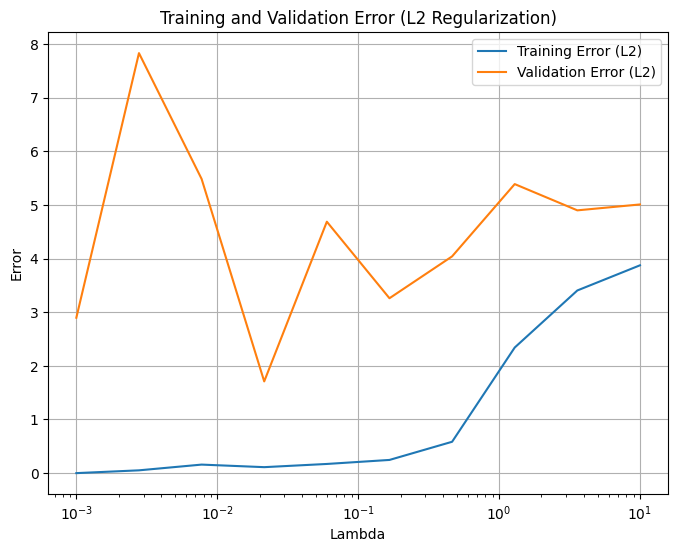

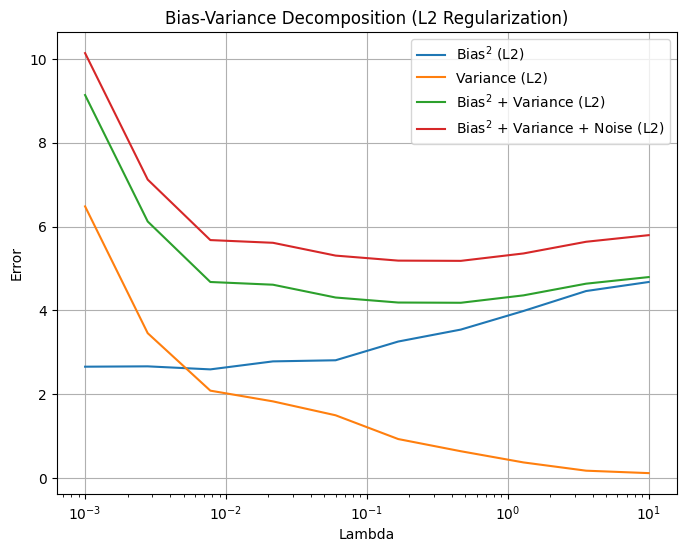

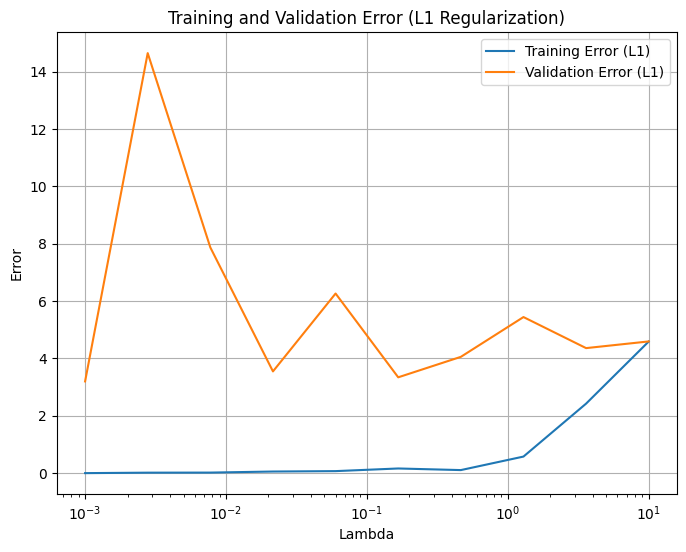

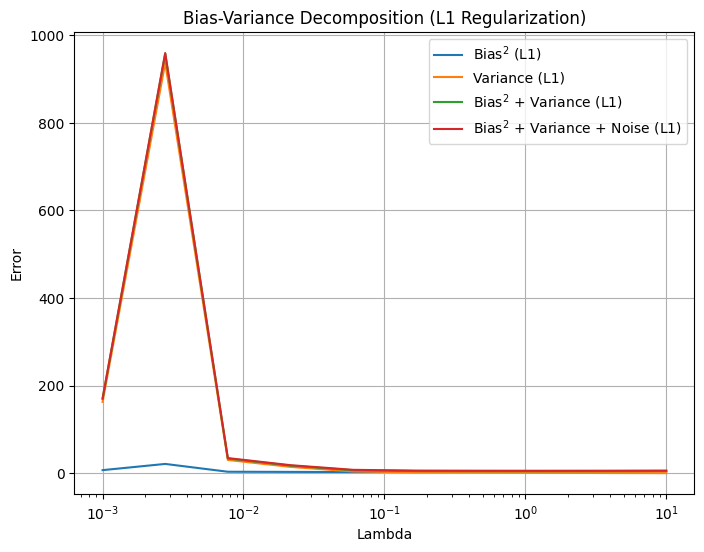

In [ ]:
# Plot for L2 regularization: Training and Validation Error
plt.figure(figsize=(8, 6))
plt.plot(lambdas, train_errors_L2, label='Training Error (L2)')
plt.plot(lambdas, val_errors_L2, label='Validation Error (L2)')
plt.xscale('log')
plt.xlabel('Lambda')
plt.ylabel('Error')
plt.title('Training and Validation Error (L2 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for L2 regularization: Bias-Variance Decomposition
plt.figure(figsize=(8, 6))
plt.plot(lambdas, bias2_L2, label='Bias$^2$ (L2)')
plt.plot(lambdas, var_L2, label='Variance (L2)')
plt.plot(lambdas, total_error_no_noise_L2, label='Bias$^2$ + Variance (L2)')
plt.plot(lambdas, total_error_L2, label='Bias$^2$ + Variance + Noise (L2)')
plt.xscale('log')
plt.xlabel('Lambda')
plt.ylabel('Error')
plt.title('Bias-Variance Decomposition (L2 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for L1 regularization: Training and Validation Error
plt.figure(figsize=(8, 6))
plt.plot(lambdas, train_errors_L1, label='Training Error (L1)')
plt.plot(lambdas, val_errors_L1, label='Validation Error (L1)')
plt.xscale('log')
plt.xlabel('Lambda')
plt.ylabel('Error')
plt.title('Training and Validation Error (L1 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for L1 regularization: Bias-Variance Decomposition
plt.figure(figsize=(8, 6))
plt.plot(lambdas, bias2_L1, label='Bias$^2$ (L1)')
# print(lambdas)
# print(bias2_L1)
plt.plot(lambdas, var_L1, label='Variance (L1)')
plt.plot(lambdas, total_error_no_noise_L1, label='Bias$^2$ + Variance (L1)')
plt.plot(lambdas, total_error_L1, label='Bias$^2$ + Variance + Noise (L1)')
plt.xscale('log')
plt.xlabel('Lambda')
plt.ylabel('Error')
plt.title('Bias-Variance Decomposition (L1 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

# Task 4

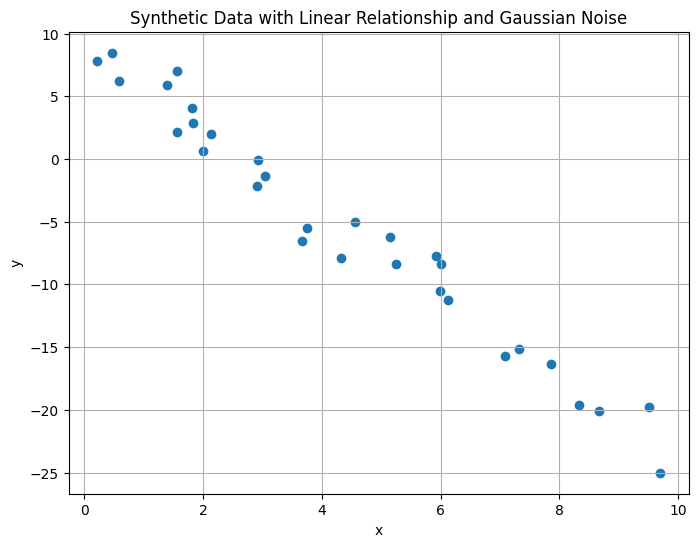

In [ ]:
np.random.seed(42)
N = 30
x = np.random.uniform(0, 10, size=N)
epsilon = np.random.normal(0, 1, size=N) # Gaussian noise with mean 0 and variance 1
y = -3 * x + 8 + 2 * epsilon

# Display the generated data
plt.figure(figsize=(8, 6))
plt.scatter(x, y)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Synthetic Data with Linear Relationship and Gaussian Noise")
plt.grid(True)
plt.show()

In [ ]:
class GradientDescent:

    def __init__(self, learning_rate=.001, max_iters=1e4, epsilon=1e-8, record_history=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.record_history = record_history
        self.epsilon = epsilon
        if record_history:
            self.w_history = []

    def run(self, gradient_fn, x, y, w):
        grad = np.inf
        t = 1
        if self.record_history:
                self.w_history.append(w.copy()) # Record initial weights
        while np.linalg.norm(grad) > self.epsilon and t < self.max_iters:
            grad = gradient_fn(x, y, w)
            w = w - self.learning_rate * grad
            if self.record_history:
                self.w_history.append(w.copy()) # Record weights at each step
            t += 1
        return w

class LinearRegression: # Modified to include regularization
    def __init__(self, add_bias=True, lambda_reg=0.0, reg_type='none'):
        self.add_bias = add_bias
        self.lambda_reg = lambda_reg
        self.reg_type = reg_type.lower()
        self.w = None

    def fit(self, x, y, optimizer):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x,np.ones(N)])
        N,D = x.shape

        def gradient(x, y, w):
            yh =  x @ w
            N, D = x.shape
            grad = .5*np.dot(yh - y, x)/N

            # Add regularization term to the gradient
            if self.reg_type == 'l2':  # Ridge
                grad += self.lambda_reg * w
            elif self.reg_type == 'l1': # Lasso
                grad += self.lambda_reg * np.sign(w)
            elif self.reg_type == 'none': # No regularization
                pass
            else:
                 raise ValueError("reg_type must be 'l1', 'l2', or 'none'")

            return grad

        w0 = np.zeros(D)
        self.w = optimizer.run(gradient, x, y, w0)
        return self

    def predict(self, x):
        if x.ndim == 1:
            x = x[:, None]
        # Add bias column if not already present (and was added during fit)
        if self.add_bias and x.shape[1] == len(self.w) - 1:
             x = np.column_stack([x,np.ones(x.shape[0])])
        # Handle case where bias was not added during fit but add_bias is True during predict (shouldn't happen with typical workflow but for robustness)
        elif not self.add_bias and x.shape[1] == len(self.w):
             pass # X already has the correct number of features
        elif x.shape[1] != len(self.w):
             raise ValueError(f"Input shape {x.shape} does not match fitted weights shape {self.w.shape}. Ensure add_bias is consistent between fit and predict.")

        yh = x @ self.w
        return yh

In [ ]:
import itertools
def plot_contour(f, x1bound, x2bound, resolution, ax):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        zg[i,j] = f([xg[i,j], yg[i,j]])
    ax.contour(xg, yg, zg, 100)
    return ax

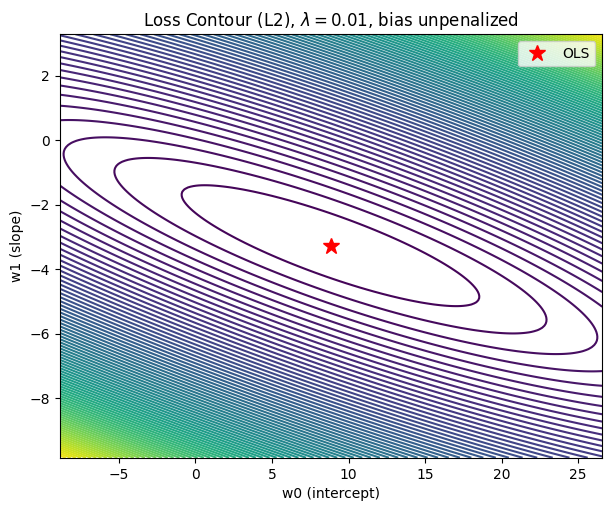

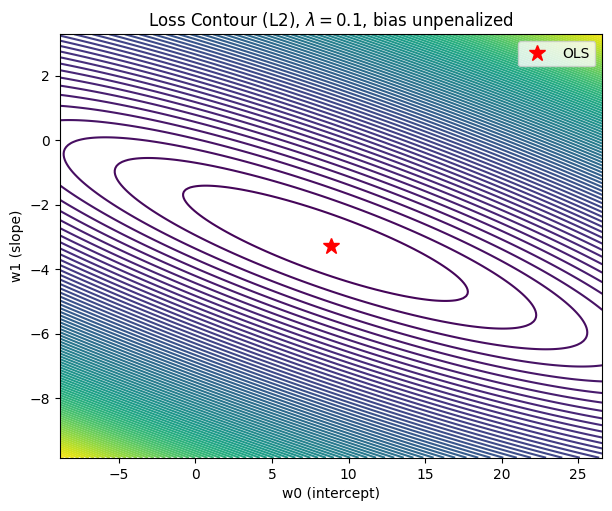

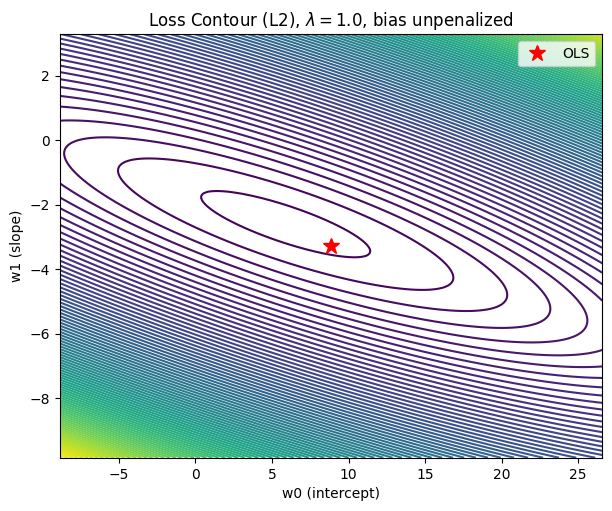

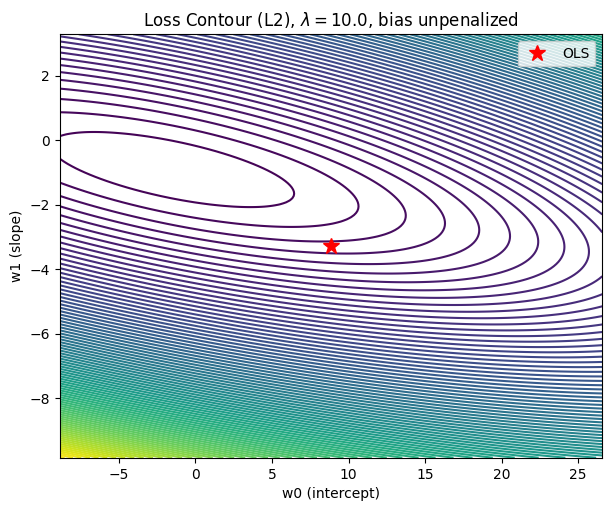

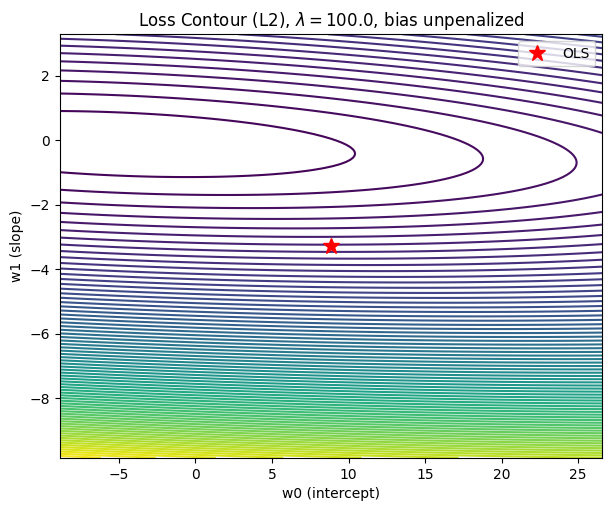

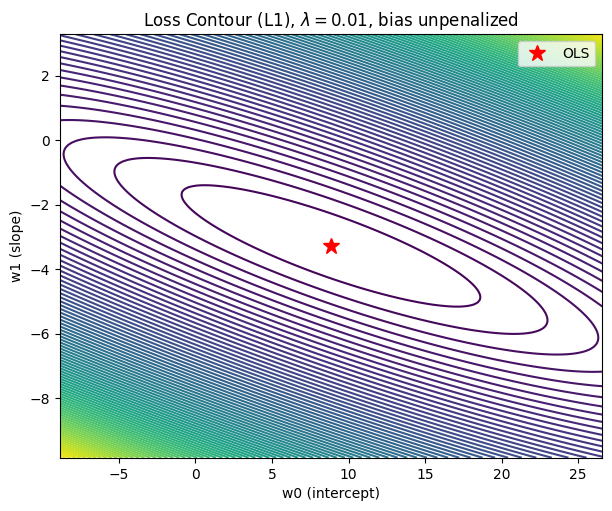

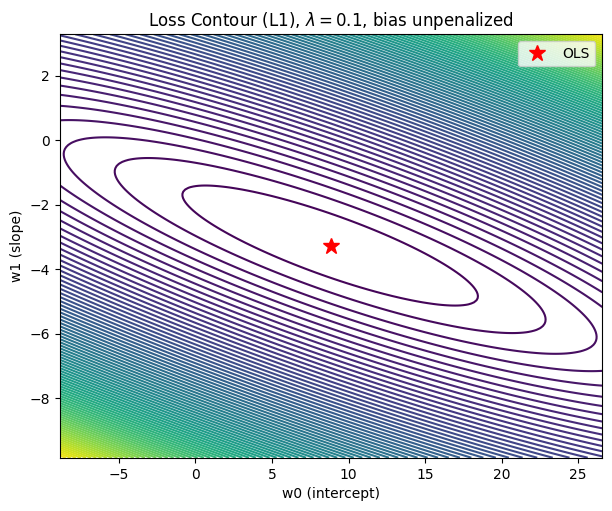

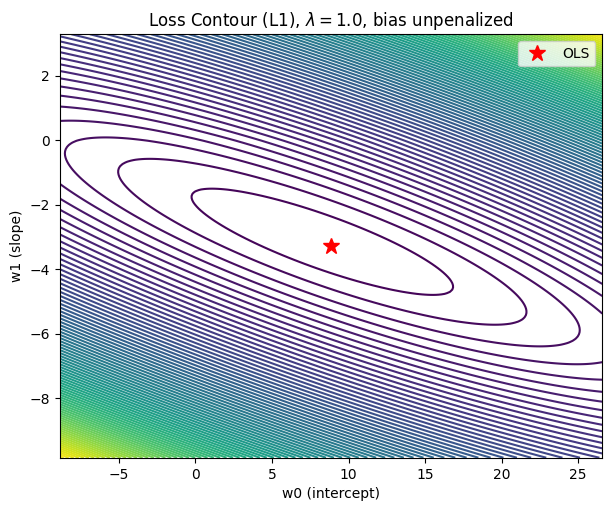

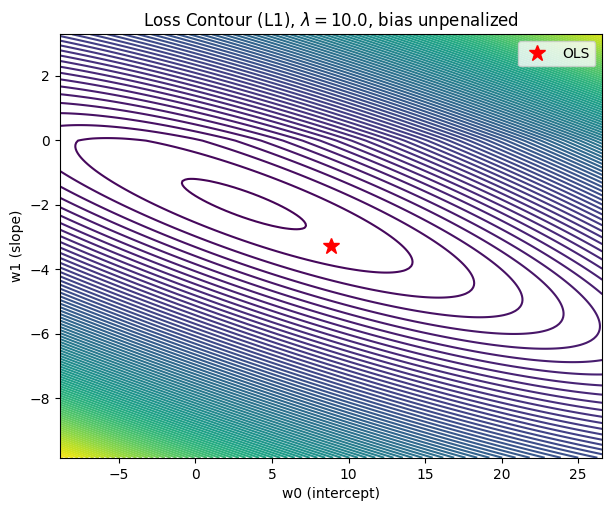

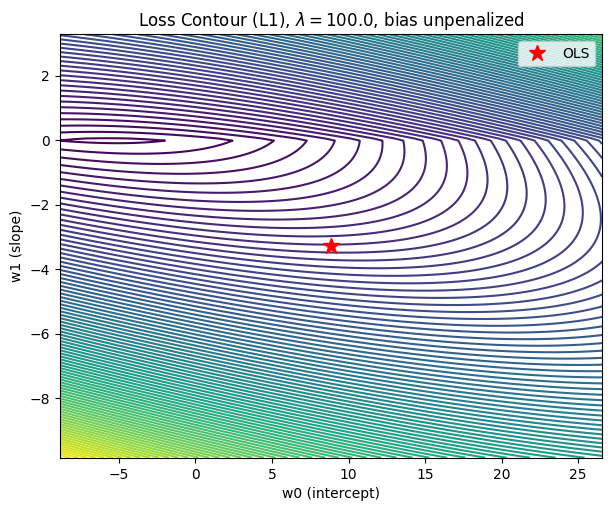

In [ ]:
def cost(w):
    w = np.asarray(w).ravel()
    b, a = w[0], w[1]
    r = (b + a * x) - y
    return 0.5 * np.mean(r ** 2)

PENALIZE_BIAS = False

def l2_penalty(w):
    w = np.asarray(w).ravel()
    w_reg = w if PENALIZE_BIAS else w[1:]
    return np.dot(w_reg, w_reg)

def l1_penalty(w):
    w = np.asarray(w).ravel()
    w_reg = w if PENALIZE_BIAS else w[1:]
    return np.sum(np.abs(w_reg))

def make_obj(lam, reg_type='l2'):
    if reg_type == 'l2':
        return lambda w: cost(w) + lam * l2_penalty(w)
    elif reg_type == 'l1':
        return lambda w: cost(w) + lam * l1_penalty(w)
    else:
        return cost

Xb_ols = np.column_stack([np.ones_like(x), x])
w_ols, *_ = np.linalg.lstsq(Xb_ols, y, rcond=None)

pad_b = max(4.0, 2 * abs(w_ols[0]))
pad_a = max(4.0, 2 * abs(w_ols[1]))
b_bounds = [w_ols[0] - pad_b, w_ols[0] + pad_b]
a_bounds = [w_ols[1] - pad_a, w_ols[1] + pad_a]


lambda_values = np.logspace(-2, 2, 5)   # 0.01 ~ 100
resolution = 200

# L2
for lam in lambda_values:
    fig, ax = plt.subplots(figsize=(7, 5.5))
    obj = make_obj(lam, 'l2')
    plot_contour(obj, b_bounds, a_bounds, resolution, ax)
    ax.plot(w_ols[0], w_ols[1], 'r*', ms=12, label='OLS')
    ax.set_xlabel("w0 (intercept)")
    ax.set_ylabel("w1 (slope)")
    ax.set_title(fr"Loss Contour (L2), $\lambda={lam}$"
                 + (", bias penalized" if PENALIZE_BIAS else ", bias unpenalized"))
    ax.legend(); plt.show()

# L1
for lam in lambda_values:
    fig, ax = plt.subplots(figsize=(7, 5.5))
    obj = make_obj(lam, 'l1')
    plot_contour(obj, b_bounds, a_bounds, resolution, ax)
    ax.plot(w_ols[0], w_ols[1], 'r*', ms=12, label='OLS')
    ax.set_xlabel("w0 (intercept)")
    ax.set_ylabel("w1 (slope)")
    ax.set_title(fr"Loss Contour (L1), $\lambda={lam}$"
                 + (", bias penalized" if PENALIZE_BIAS else ", bias unpenalized"))
    ax.legend(); plt.show()

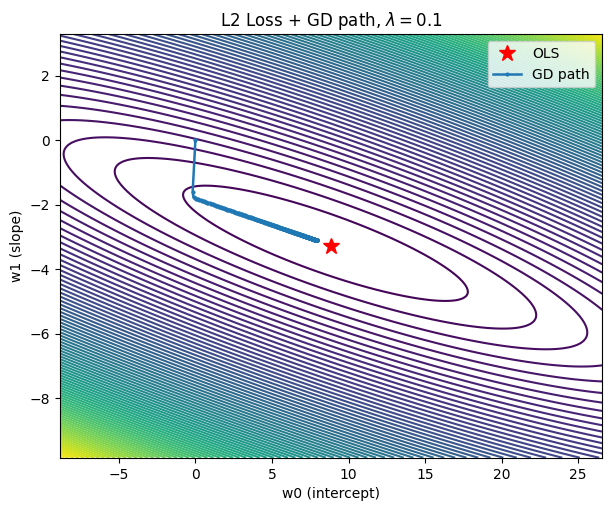

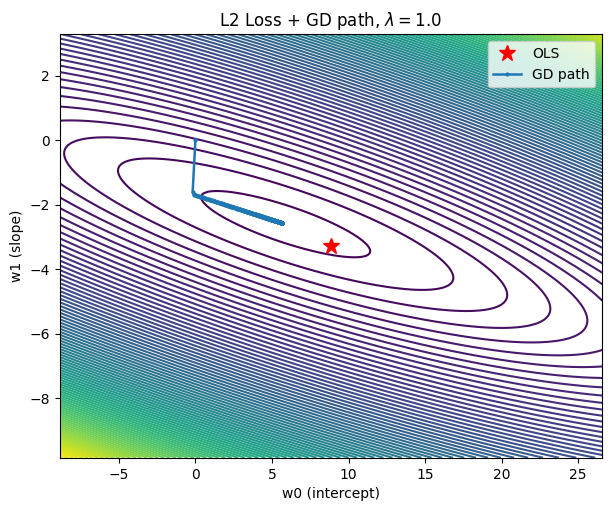

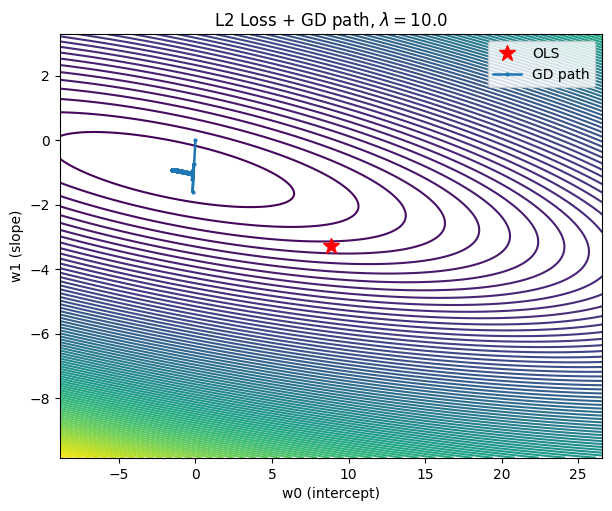

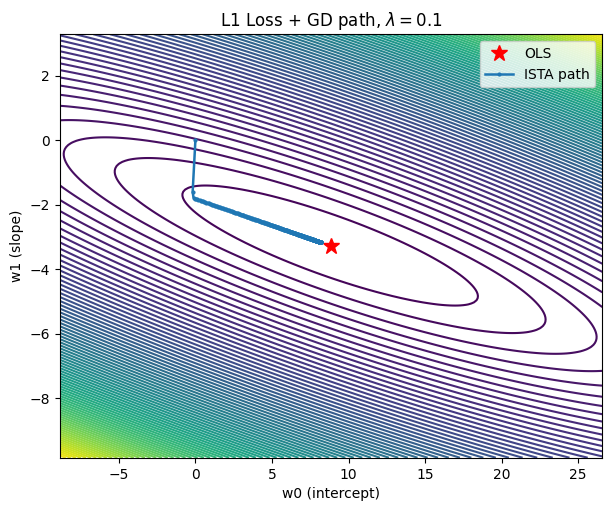

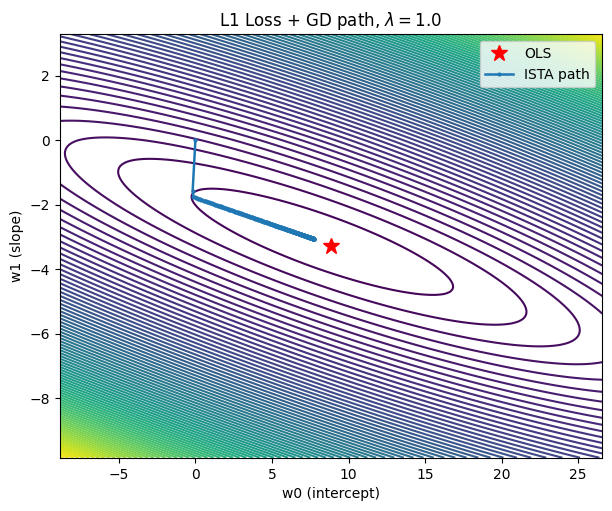

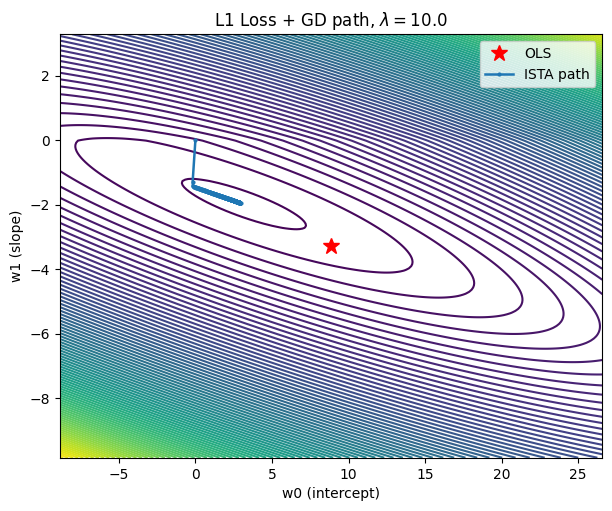

In [ ]:
Xb = np.column_stack([np.ones_like(x), x])
N = len(y)
L = (np.linalg.norm(Xb, 2) ** 2) / N
lr_l2  = 0.9 / (L + 1e-12)
lr_l1  = lr_l2

def ridge_gd_path(lam, steps=300, w0=None):
    w = np.zeros(2) if w0 is None else np.array(w0, float)
    path = [w.copy()]
    for _ in range(steps):
        r = Xb @ w - y
        grad = (Xb.T @ r) / N
        grad += 2 * lam * np.array([0.0, w[1]])
        w = w - lr_l2 * grad
        path.append(w.copy())
    return np.array(path)

def soft(a, tau):
    return np.sign(a) * np.maximum(np.abs(a) - tau, 0.0)

def lasso_ista_path(lam, steps=300, w0=None):
    w = np.zeros(2) if w0 is None else np.array(w0, float)
    path = [w.copy()]
    for _ in range(steps):
        r = Xb @ w - y
        u = w - lr_l1 * (Xb.T @ r) / N
        w = np.array([u[0], soft(u[1], lr_l1 * lam)])
        path.append(w.copy())
    return np.array(path)

resolution = 200
for lam in lambda_values:
    # ----- L2 -----
    fig, ax = plt.subplots(figsize=(7, 5.5))
    obj = make_obj(lam, 'l2')
    plot_contour(obj, b_bounds, a_bounds, resolution, ax)
    ax.plot(w_ols[0], w_ols[1], 'r*', ms=12, label='OLS')

    p = ridge_gd_path(lam, steps=300, w0=[0.0, 0.0])
    ax.plot(p[:,0], p[:,1], 'o-', ms=2, lw=1.8, label='GD path')

    ax.set_xlabel("w0 (intercept)"); ax.set_ylabel("w1 (slope)")
    ax.set_title(fr"L2 Loss + GD path, $\lambda={lam}$")
    ax.legend(); plt.show()

for lam in lambda_values:
    # ----- L1 -----
    fig, ax = plt.subplots(figsize=(7, 5.5))
    obj = make_obj(lam, 'l1')
    plot_contour(obj, b_bounds, a_bounds, resolution, ax)
    ax.plot(w_ols[0], w_ols[1], 'r*', ms=12, label='OLS')

    p = lasso_ista_path(lam, steps=300, w0=[0.0, 0.0])
    ax.plot(p[:,0], p[:,1], 'o-', ms=2, lw=1.8, label='ISTA path')

    ax.set_xlabel("w0 (intercept)"); ax.set_ylabel("w1 (slope)")
    ax.set_title(fr"L1 Loss + GD path, $\lambda={lam}$")
    ax.legend(); plt.show()

